<a href="https://colab.research.google.com/github/jjvemz/ML-and-DL-Bootcamp/blob/main/end_to_end_dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a target="_blank" href="https://colab.research.google.com/github/mrdbourke/zero-to-mastery-ml/blob/master/section-4-unstructured-data-projects/end-to-end-dog-vision-v2.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Abrir en Colab"/>
</a>

[Ver código fuente](https://github.com/mrdbourke/zero-to-mastery-ml/blob/master/section-4-unstructured-data-projects/end-to-end-dog-vision-v2.ipynb) | [Leer notebook en formato de libro online](https://dev.mrdbourke.com/zero-to-mastery-ml/end-to-end-dog-vision-v2/)

# Introducción a TensorFlow, Deep Learning y Transfer Learning (en progreso)

* **Proyecto:** Dog Vision 🐶👁 – Usar visión por computador para clasificar fotos de perros en distintas razas.
* **Objetivos:** Aprender TensorFlow, deep learning y transfer learning; superar los resultados del paper original (22% de accuracy).
* **Dominio:** Visión por computador.
* **Datos:** Imágenes de perros del [Stanford Dogs Dataset](http://vision.stanford.edu/aditya86/ImageNetDogs/) (120 razas, más de 20.000 imágenes).
* **Tipo de problema:** Clasificación multiclase (120 clases distintas).
* **Ejecución:** El proyecto está diseñado para correrse de principio a fin en [Google Colab](https://colab.research.google.com/) (con acceso gratuito a GPU y configuración sencilla). Para ejecutarlo localmente se requiere preparar el entorno.
* **Demo:** Mira una [demo del modelo entrenado en Hugging Face Spaces](https://huggingface.co/spaces/mrdbourke/dog_vision).

¡Bienvenido, bienvenida!

El enfoque de este notebook es dar una visión rápida del deep learning con TensorFlow/Keras.

¿Cómo?

Vamos a recorrer los pasos del flujo de trabajo de machine learning y construir un proyecto de visión por computador para clasificar fotos de perros en su respectiva raza (una tarea de IA predictiva, ver más abajo).

<img src="https://github.com/mrdbourke/zero-to-mastery-ml/blob/master/images/unstructured-data-dog-vision-project-outline.png?raw=true" width="750" alt="diagrama del proyecto dog vision desde imágenes de perros hasta una red neuronal capaz de identificar diferentes razas"/>

*Lo que vamos a construir: Dog Vision 🐶👁️, una red neuronal capaz de identificar distintas razas de perros en imágenes, desde la preparación del dataset hasta la construcción, entrenamiento y evaluación del modelo.*


## Qué vamos a cubrir

En este proyecto veremos el poder del deep learning y, más específicamente, del transfer learning usando TensorFlow/Keras.

Recorreremos cada uno de estos puntos dentro del contexto del [marco de 6 pasos para proyectos de machine learning](https://dev.mrdbourke.com/zero-to-mastery-ml/a-6-step-framework-for-approaching-machine-learning-projects/):

1. **Definición del problema** – Usar visión por computador para clasificar fotos de perros en distintas razas.
2. **Datos** – Más de 20.000 imágenes de perros pertenecientes a 120 razas distintas del [Stanford Dogs dataset](http://vision.stanford.edu/aditya86/ImageNetDogs/).
3. **Evaluación** – Queremos superar los resultados del paper original (22% de accuracy promedio en todas las clases; **tip:** una buena práctica es buscar resultados online e intentar superarlos).
4. **Características (features)** – Como usamos deep learning, el modelo aprenderá las características por sí mismo.
5. **Modelado** – Utilizaremos una red neuronal convolucional (CNN) preentrenada y aplicaremos transfer learning.
6. **Experimentos** – Probaremos distintas cantidades de datos con el mismo modelo para observar cómo afectan los resultados.

> **Nota:** No pasa nada si estos pasos no te resultan familiares todavía. Cuando empiezas un proyecto nuevo, muchas veces las cosas se van aclarando sobre la marcha. Aquí están completos porque ya he trabajado en varios proyectos de machine learning. Con el tiempo irás incorporando estos conceptos.


### Preparando nuestro entorno de trabajo

* Importar TensorFlow 2.x ✅
* Importar TensorFlow Hub ✅
* Verificar que estamos usando una GPU ✅


In [1]:

import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

#Revisando la disponibilidad
print("GPU", "LISTO, ESTA DISPONIBLE!!!!!)" if tf.config.list_physical_devices("GPU") else "No lo esta:(")

TF version: 2.19.0
TF Hub version: 0.16.1
GPU LISTO, ESTA DISPONIBLE!!!!!)


### Preparando los datos

In [2]:
#!unzip "/content/drive/MyDrive/datadog/dog-breed-identification.zip" -d "/content/drive/MyDrive/datadog/data"

## Preparando nuestros datos (convirtiéndolos en Tensors)

Para cualquier modelo de machine learning, los datos deben estar en formato numérico. Así que eso será lo primero que haremos: convertir nuestras imágenes en Tensors (representaciones numéricas).

Comencemos accediendo a nuestros datos y revisando las etiquetas.


In [3]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/datadog/data/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


Raza de perro por cantidad en histograma

<Axes: xlabel='breed'>

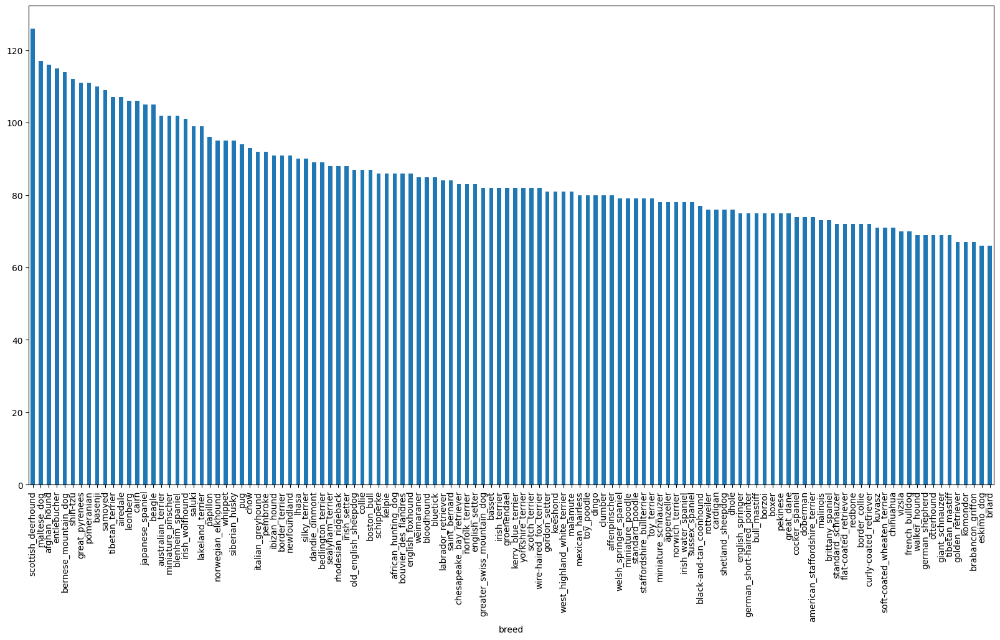

In [5]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

Mediana de las razas de perro

In [6]:
labels_csv["breed"].value_counts().median()

82.0

### Obteniendo imagenes y sus etiquetas
Enlistemos las imagenes

In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
filenames = ["/content/drive/MyDrive/datadog/data/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# revisar los 10 primeros
filenames[:10]

['/content/drive/MyDrive/datadog/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/datadog/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/datadog/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/datadog/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/datadog/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/datadog/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/datadog/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/datadog/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/datadog/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/datadog/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
labels_csv["breed"][9000]

'tibetan_mastiff'

#### Preparando las etiquteas

In [10]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [11]:
len(labels)

10222

In [12]:
import os
if len(os.listdir("/content/drive/MyDrive/datadog/data/train/")) == len(filenames):
  print("Las etiquetas tienen la misma cantidad que los nombres de archivo!!! Siga.")
else:
  print("Las etiquetas NO tienen la misma cantidad que los nombres de archivos, por favor revise.")

Las etiquetas tienen la misma cantidad que los nombres de archivo!!! Siga.


In [13]:
if len(labels) == len(filenames):
  print("Las etiquetas tienen la misma cantidad que los nombres de archivo!")

else:
  print("Las etiquetas NO tienen la misma cantidad que los nombres de archivos!")

Las etiquetas tienen la misma cantidad que los nombres de archivo!


Busquemos las etiquetas unitcas

In [14]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [15]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

####Convertiremos una etiqueta en un arreglo booleano

In [16]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
len(labels)

10222

In [18]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

### Ejemplo de conversion de arreglo de binarios a uno de enteros

In [20]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[3])
print(boolean_labels[2].astype(int))

bluetick
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [23]:
filenames[:10]

['/content/drive/MyDrive/datadog/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/datadog/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/datadog/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/datadog/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/datadog/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/datadog/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/datadog/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/datadog/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/datadog/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/datadog/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Ahora crearemos nuestro propio set de validación
Ya que nuestro dataset de Kaggle no tiene un set de validación lo haremos de forma manual

In [24]:
x = filenames
y = boolean_labels

Vamos a comenzar a experimentar con ~1000 imagenes y aumentarlas de ser necesarias.

In [25]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

##### Ahora haremos un split de nuestros datos entre set de entrenamiento y validación

In [26]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocesamiento de imágenes (convirtiendo imágenes en Tensors)

Para preprocesar nuestras imágenes y transformarlas en Tensors, vamos a escribir una función que haga lo siguiente:

1. Tomar la ruta de un archivo de imagen como entrada.  
2. Usar TensorFlow para leer el archivo y guardarlo en una variable llamada `image`.  
3. Convertir nuestra `image` (un archivo .jpg) en Tensors.  
4. Normalizar la imagen (convertir los valores de los canales de color de 0–255 a 0–1).  
5. Redimensionar la `image` a una forma de (224, 224).  
6. Retornar la `image` modificada.

Antes de hacerlo, veamos cómo se ve al importar una imagen.


Convirtiendo una imagen en un arreglo Numpy

In [27]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [28]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [29]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

#### Convirtiendo una imagen en un tensor

In [30]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Ahora que vimos cómo se ve una imagen como Tensor, creemos una función para preprocesarlas.

Crearemos una función que:

1. Tome la ruta de una imagen como entrada.  
2. Use TensorFlow para leer el archivo y guardarlo en una variable llamada `image`.  
3. Convierta nuestra `image` (un archivo .jpg) en Tensors.  
4. Normalice la imagen (convertir los valores de los canales de color de 0–255 a 0–1).  
5. Redimensione la `image` a una forma de (224, 224).  
6. Devuelva la `image` modificada.

Puedes ver más información sobre cómo cargar imágenes en TensorFlow aquí:  
https://www.tensorflow.org/tutorials/load_data/images


In [31]:
#Definimos el tamaño de la imagen
IMG_SIZE= 224

def process_image(image_path, img_size=IMG_SIZE):
  """
    Toma un file path de una imagen y la convierte en un tensor
  """
  # Leer un archivo de imagen
  image = tf.io.read_file(image_path)
  # Convertir la imagen jpeg en un Tensor numérico con 3 canales de color (Rojo, Verde, Azul)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convertir los valores de los canales de color de 0-255 a valores entre 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Redimensionar la imagen al tamaño deseado (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Convirtiendo nuestros datos en lotes

¿Por qué convertir nuestros datos en lotes?

Supongamos que quieres procesar más de 10.000 imágenes de una sola vez… puede que no quepan todas en la memoria.

Por eso procesamos aproximadamente 32 imágenes a la vez (esto se llama tamaño de lote o *batch size*, y se puede ajustar manualmente si es necesario).

Para usar TensorFlow de manera efectiva, necesitamos que nuestros datos estén en forma de tuplas de Tensors que se vean así:  
`(imagen, etiqueta)`.


In [32]:
def get_image_label(image_path, label):
  """
    Toma un filepath de una image y su etiqueta asociada,
    procesa la imagen y retorna una tupla (imagen, etiqueta)
  """
  image = process_image(image_path)
  return image, label

### Demostración

In [33]:
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Ahora que tenemos una forma de convertir nuestros datos en tuplas de Tensors con el formato `(imagen, etiqueta)`, ¡cree­mos una función para transformar todos nuestros datos (`X` y `y`) en lotes!


In [34]:
#Definiremos el tamaño del lote
BATCH_SIZE= 32

def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Crea lotes de datos a partir de pares de imágenes (X) y etiquetas (y).
  Baraja los datos si son de entrenamiento, pero no los baraja si son de validación.
  También acepta datos de prueba como entrada (sin etiquetas).
  """
  # Si los datos son de prueba, probablemente no tengamos etiquetas
  if test_data:
      print("Creando lotes de datos de prueba...")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))  # solo rutas de archivo (sin etiquetas)
      data_batch = data.map(process_image).batch(BATCH_SIZE)
      return data_batch

  # Si los datos son de validación, no es necesario barajarlos
  elif valid_data:
      print("Creando lotes de datos de validación...")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  # rutas de archivo
                                                tf.constant(y))) # etiquetas
      data_batch = data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch

  else:
      print("Creando lotes de datos de entrenamiento...")
      # Convertir rutas de archivo y etiquetas en Tensors
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                tf.constant(y)))
      # Barajar rutas y etiquetas antes de mapear la función de procesamiento es más rápido que barajar imágenes
      data = data.shuffle(buffer_size=len(x))

      # Crear tuplas (imagen, etiqueta) (esto también convierte la ruta en una imagen preprocesada)
      data = data.map(get_image_label)

      # Convertir los datos de entrenamiento en lotes
      data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [35]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creando lotes de datos de entrenamiento...
Creando lotes de datos de validación...


In [36]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizando datos de los lotes
Nuestros datos ahora estan en lotes pero al ser dificiles de entender lo mejor es visualizarlos

In [37]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  """
    Muestra una gráfica de 25 imagenes y sus etiquetas de un lote de datos
  """
  plt.figure(figsize=(10, 10))

  for i in range(25):
    ax = plt.subplot(5,5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [38]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

### Visualicemos los datos

Datos de visualización

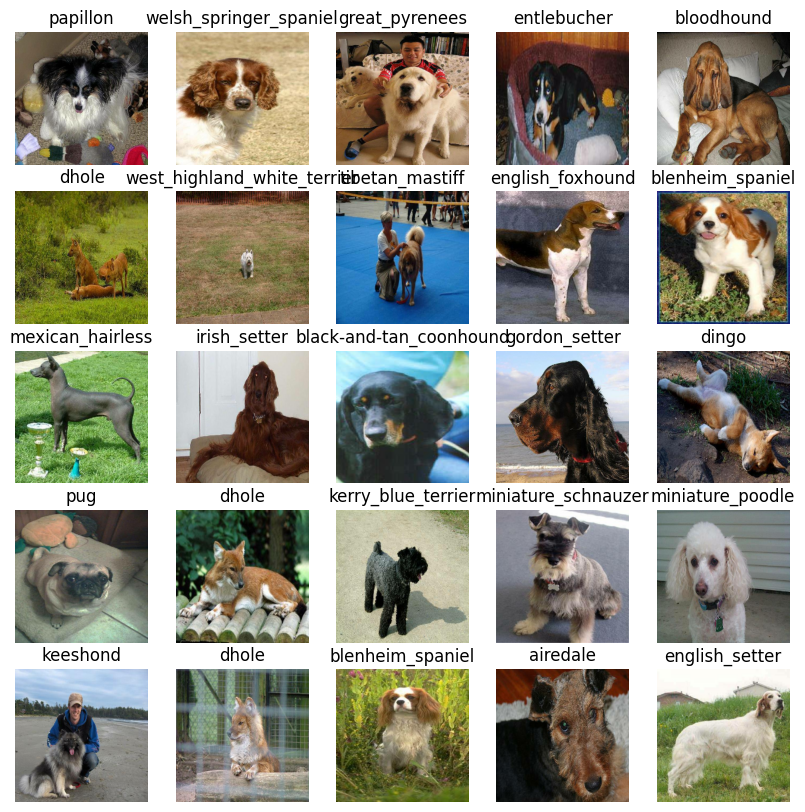

In [39]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

Visualicemos los datos de validación

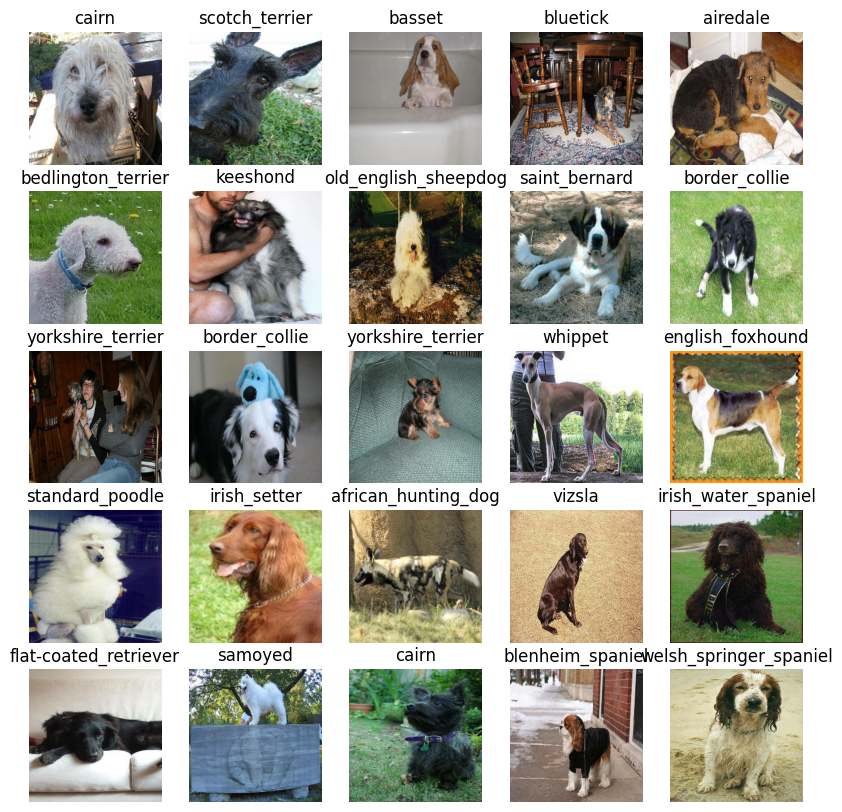

In [40]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Construyendo un modelo de ML
Antes de construir el modelo, necesitamos definir:
1.   El input shape de nuestro modelo (shape de las imagenes, en forma de tensores)
2.   El output shape de nuestro modelo (shape de las imagenes, en forma de tensores)
3. El URL del modelo que usaremos de Tensorflow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [41]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # lote, altura, anchura, canales de color

OUTPUT_SHAPE = len(unique_breeds)

# Mantendremos el URL del extractor de características
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Ahora que tenemos nuestras entradas, salidas y el modelo listo, ¡juntemos todo en un modelo de deep learning con Keras!

Con esto en mente, creemos una función que:

* Tome como parámetros el shape de entrada, el shape de salida y el modelo que hemos elegido.  
* Defina las capas de un modelo Keras de manera secuencial (primero esto, luego esto otro, y así sucesivamente).  
* Compile el modelo (indicando cómo debe evaluarse y optimizarse).  
* Construya el modelo (informando cuál será la forma de entrada que recibirá).  
* Devuelva el modelo.

Todos estos pasos pueden encontrarse aquí:  
https://www.tensorflow.org/guide/keras/overview

Crearemos una funcion que implemente un modelo Keras

In [42]:
import tf_keras

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Configurando las capas del modelo
    model = tf_keras.Sequential([
        hub.KerasLayer(model_url),  #Capa 1 (input layer)
        tf_keras.layers.Dense(units=output_shape,
                              activation="softmax")  # Capa 2 (output layer)
    ])

    # Compilando el modelo
    model.compile(
        loss=tf_keras.losses.CategoricalCrossentropy(), #que tan bien el modelo predice
        optimizer=tf_keras.optimizers.Adam(), #cuanto mejora las predicciones
        metrics=["accuracy"] #Forma de evaluar el modelo
    )

    # Buildeando el modelo
    model.build(input_shape)

    return model


In [43]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creando callbacks

Los callbacks son funciones auxiliares que un modelo puede utilizar durante el entrenamiento para realizar acciones como guardar su progreso, revisar su desempeño o detener el entrenamiento de forma anticipada si deja de mejorar.

Crearemos dos callbacks: uno para TensorBoard, que ayuda a seguir el progreso del modelo, y otro para *early stopping*, que evita que el modelo entrene más de lo necesario.

### Callback de TensorBoard

Para configurar un callback de TensorBoard necesitamos hacer 3 cosas:

1. Cargar la extensión de notebook de TensorBoard. ✅  
2. Crear un callback de TensorBoard capaz de guardar los registros en un directorio y pasarlo a la función `fit()` de nuestro modelo. ✅  
3. Visualizar los registros de entrenamiento del modelo usando la función mágica `%tensorboard` (esto lo haremos después del entrenamiento).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

Cargando la extensión de TensorBoard Notebook

In [44]:
%load_ext tensorboard

In [45]:
import datetime

#Crear una función para construir un callback de TensorBoard
def create_tensorboard_callback():
  #Crearemos una carpeta para los logs de Tensorboards
  logdir = os.path.join("/content/drive/MyDrive/datadog/logs/",
                        #Estarán formateados por fecha
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

### Callback de Early Stopping o detención preventiva

El *early stopping* ayuda a evitar el sobreajuste deteniendo el entrenamiento si una métrica de evaluación deja de mejorar.

[Documentación oficial](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping)


In [46]:
#Crearemos un callback de early stopping
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Entrenando nuestro ,modelo con un subset de datos
Nuestro primer modelo será entrenado con 1000 imagenes, para asegurarnos de que funcione correctamente

In [47]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [48]:
print("GPU", "lista para el uso " if tf.config.list_physical_devices("GPU") else "no disponible")

GPU lista para el uso 


Vamos a crear una función que entrene un modelo.

* Crear un modelo usando `create_model()`  
* Configurar un callback de TensorBoard usando `create_tensorboard_callback()`  
* Llamar a la función `fit()` en nuestro modelo, pasando los datos de entrenamiento, los datos de validación, el número de épocas (`NUM_EPOCHS`) y los callbacks que queramos usar  
* Devolver el modelo


In [49]:
# La función servirá para entrenar al modelo y retornarlo entrenado
def train_model():

  model = create_model()

  # Crear un callback de TensorBoard
  tensorboard = create_tensorboard_callback()

  # Entrenar el modelo
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

Fit al modelo actual

In [50]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 190s 7s/step - loss: 4.5533 - accuracy: 0.0925 - val_loss: 3.3514 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 9s 383ms/step - loss: 1.6284 - accuracy: 0.6675 - val_loss: 2.0929 - val_accuracy: 0.5650
Epoch 3/100
25/25 [==============================] - 6s 255ms/step - loss: 0.5601 - accuracy: 0.9400 - val_loss: 1.6523 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 7s 293ms/step - loss: 0.2528 - accuracy: 0.9862 - val_loss: 1.4616 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 177ms/step - loss: 0.1485 - accuracy: 0.9950 - val_loss: 1.3792 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 4s 161ms/step - loss: 0.1030 - accuracy: 0.9975 - val_loss: 1.3288 - val_accuracy: 0.6850
Epoch 7/100
25/25 [==============================]

Al parecer el modelo está haciendo overfitting. Si bien esto al principio puede significar algo bueno porque nuestro modelo está aprendiendo, lo está haciendo de manera acelerada a lo que necesitamos para nuestros resultados.

## Revisando los logs de tensorboard

In [51]:
# Revisando los logs de /content/drive/MyDrive/datadog/logs
%tensorboard --logdir /content/drive/MyDrive/datadog/logs

<IPython.core.display.Javascript object>

## Comenzaremos a evaluar las predicciones con el modelo entrenado

In [52]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

### Predicciones con los datos de validación

In [53]:
predictions= model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 110ms/step


array([[1.6099612e-03, 3.0135012e-05, 5.1456376e-04, ..., 3.4554792e-04,
        3.2221218e-05, 1.0033472e-03],
       [3.6521989e-04, 1.7794999e-03, 3.0889458e-03, ..., 1.6878272e-04,
        5.4431465e-03, 1.5178318e-04],
       [6.4247906e-05, 1.1620409e-04, 2.6810420e-05, ..., 1.9635819e-04,
        8.3525643e-05, 4.9009093e-04],
       ...,
       [4.1160525e-05, 2.9269874e-04, 2.5883675e-05, ..., 8.3170817e-05,
        9.7544522e-05, 1.7004198e-04],
       [9.7540102e-04, 3.0632087e-04, 8.8334564e-05, ..., 2.4788564e-05,
        6.1603983e-05, 2.4869367e-03],
       [1.0453014e-03, 2.1510816e-04, 1.2587795e-03, ..., 3.4640953e-02,
        2.1808341e-04, 1.2001225e-04]], dtype=float32)

In [54]:
predictions.shape

(200, 120)

##Primera predicción

In [55]:
index = 55
print(predictions[index])
print(f"Valor maximo (probabilidad de predicción): {np.max(predictions[index])}")
print(f"Suma: {np.sum(predictions[index])}")
print(f"Index máximo: {np.argmax(predictions[index])}")
print(f"Etiqueta predecida: {unique_breeds[np.argmax(predictions[index])]}")

[5.63630402e-01 4.80903080e-04 2.62989197e-04 5.93691329e-05
 2.23738514e-03 2.35980733e-05 2.70982535e-04 1.85937097e-03
 3.41763880e-05 3.84180341e-04 1.09092041e-04 3.57002806e-04
 8.08367768e-05 2.29655430e-04 3.36380472e-04 1.60050564e-04
 7.16798764e-04 1.66817813e-03 2.06973818e-05 4.00830933e-04
 1.14798208e-03 1.56942289e-03 2.20731343e-03 3.08007984e-05
 5.68178484e-06 8.11678765e-04 3.16243544e-02 2.93499383e-04
 5.79496736e-05 5.91265131e-03 2.51648249e-04 1.42642879e-04
 2.16751723e-04 2.49994991e-05 3.71929527e-05 3.96997493e-04
 8.98924627e-05 2.11839015e-05 3.69455258e-04 3.49458387e-05
 3.52903153e-04 8.64855247e-05 2.36028689e-04 2.64455575e-05
 2.74286635e-04 6.07288559e-04 3.68578258e-05 9.53588053e-04
 4.36996401e-04 2.49623572e-05 2.62941921e-05 4.94174565e-05
 1.36812625e-04 1.03548855e-05 6.18959530e-05 1.20970806e-04
 9.21065111e-06 8.11399368e-05 1.12790418e-04 2.48036726e-04
 3.17931495e-04 3.32311122e-03 3.16846068e-04 1.80198949e-05
 1.55337737e-04 1.512165

Para calcular la etiqueta predecida de forma modular y escalar haremos una función reutilizable

In [56]:
def get_pred_label(prediction_probabilities):

  return unique_breeds[np.argmax(prediction_probabilities)]

Por ejemplo:

In [57]:
pred_label = get_pred_label(predictions[83])
pred_label

'miniature_pinscher'

Ahora, dado que nuestros datos de validación todavía están en un *batch dataset*, tendremos que “desagruparlos” (*unbatchify*) para hacer predicciones sobre las imágenes de validación y luego comparar esas predicciones con las etiquetas de validación (etiquetas verdaderas).

In [58]:
#Crear una función para unbatchify un batch dataset
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

Ejemplo de la función unbatchify:

In [59]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Ahora ya tenemos formas de obtener:
* Etiquetas predichas  
* Etiquetas de validación (etiquetas verdaderas)  
* Imágenes de validación  

Vamos a crear una función para visualizar todo esto de forma más clara.

Crearemos una función que:
* Reciba un arreglo de probabilidades de predicción, un arreglo de etiquetas verdaderas, un arreglo de imágenes y un número entero. ✅  
* Convierta las probabilidades de predicción en una etiqueta predicha. ✅
* Muestre en una sola gráfica: la etiqueta predicha, su probabilidad asociada, la etiqueta verdadera y la imagen correspondiente. ✅


In [60]:
def plot_pred(prediction_probabilities, labels, images, n=1):

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

In [61]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Obtener la etiqueta predecida
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

Ejemplo:

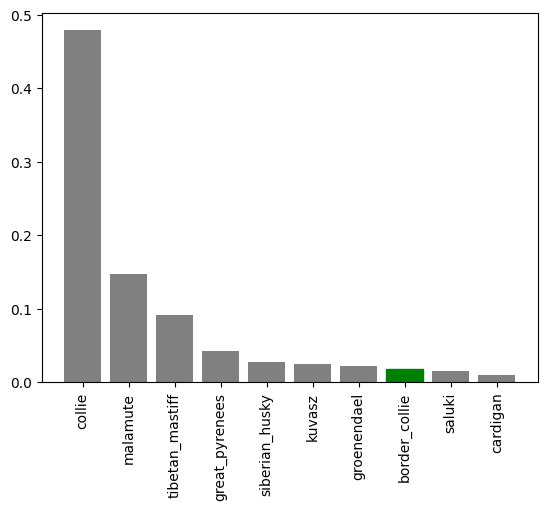

In [62]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Usaremos esta función para visualizar algunos resultados:

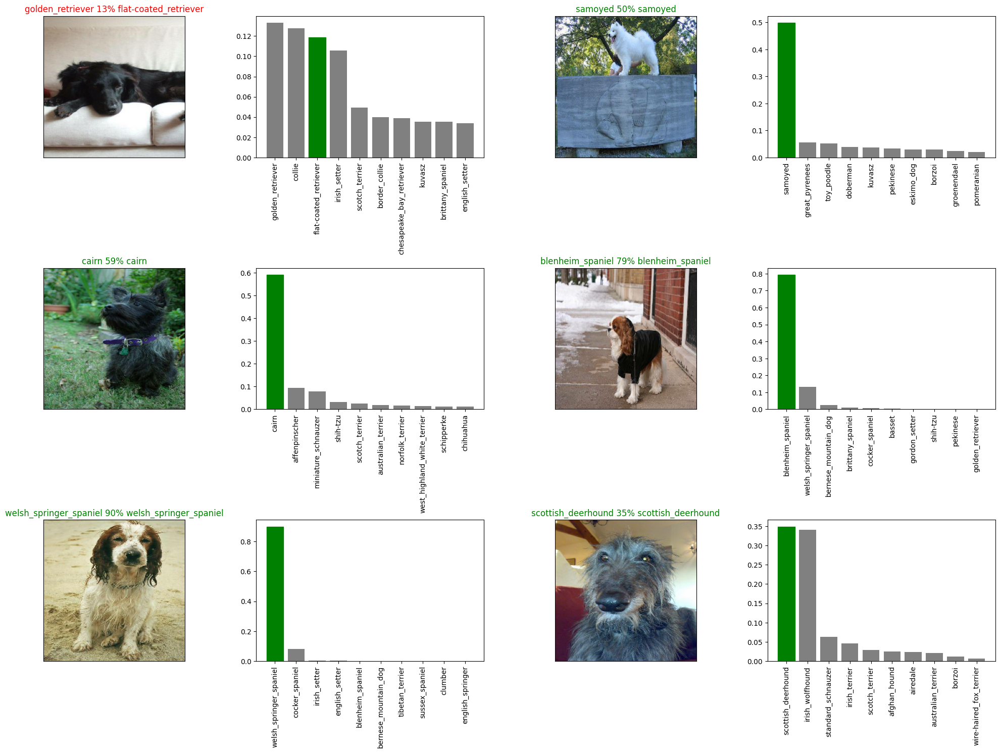

In [63]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Matriz de Confusión:
 [[2 0 0 ... 0 0 0]
 [0 4 0 ... 0 0 0]
 [0 0 2 ... 0 0 0]
 ...
 [0 0 0 ... 2 0 0]
 [0 0 0 ... 0 2 0]
 [0 0 0 ... 0 0 2]]


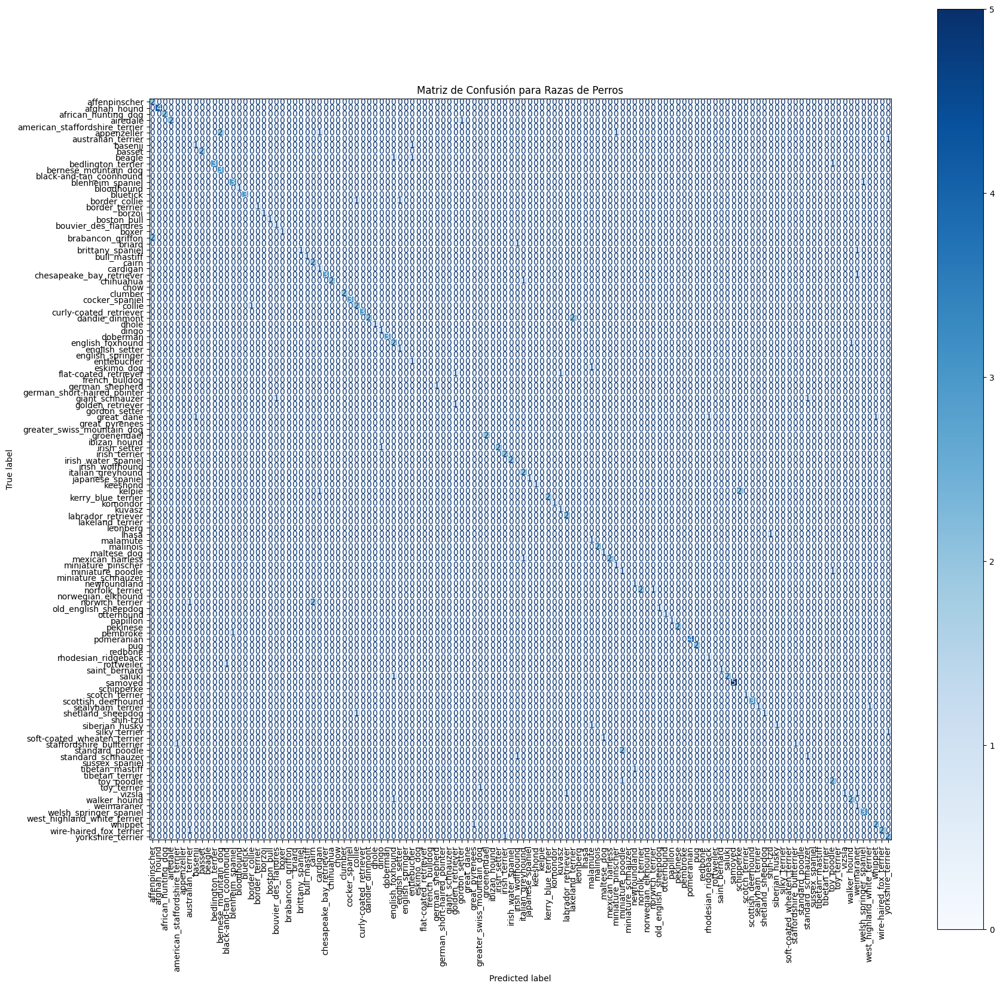

In [64]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

predicted_labels = [get_pred_label(pred_prob) for pred_prob in predictions]


cm = confusion_matrix(y_true=val_labels, y_pred=predicted_labels, labels=unique_breeds)

print("Matriz de Confusión:\n", cm)

fig, ax = plt.subplots(figsize=(20, 20))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=unique_breeds)
disp.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation='vertical')
plt.title('Matriz de Confusión para Razas de Perros')
plt.show()

##Guardando y recargando nuestro modelo entrenado

In [65]:
def save_model(model, suffix=None):
  #Crear un modelo en el pathname de la carpeta con el datetime actual
  modeldir = os.path.join("/content/drive/MyDrive/datadog/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Guardando el modelo en {model_path}...")
  model.save(model_path)
  return model_path

In [66]:
def load_model(model_path):

  print(f"Cargando el modelo de: {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Ahora que tenemos funciones para guardar y cargar modelos haremos unas pruebas

In [67]:
save_model(model, suffix="1000-images-mobilenetv2-Adam-testing")

Guardando el modelo en /content/drive/MyDrive/datadog/models/20251121-02021763690538-1000-images-mobilenetv2-Adam-testing.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/datadog/models/20251121-02021763690538-1000-images-mobilenetv2-Adam-testing.h5'

In [68]:
loading_1000_image_label= load_model("/content/drive/MyDrive/datadog/models/20251121-01261763688391-1000-images-mobilenetv2-Adam-testing.h5")

Cargando el modelo de: /content/drive/MyDrive/datadog/models/20251121-01261763688391-1000-images-mobilenetv2-Adam-testing.h5


### Evaluaremos el model pre-guardado

In [69]:
model.evaluate(val_data)

7/7 [==============================] - 1s 112ms/step - loss: 1.2649 - accuracy: 0.6850


[1.26486337184906, 0.6850000023841858]

### Y ahora el modelo cargado

In [70]:
loading_1000_image_label.evaluate(val_data)

7/7 [==============================] - 1s 107ms/step - loss: 1.2462 - accuracy: 0.6850


[1.2462406158447266, 0.6850000023841858]

### Entrenando el modelo con todos los datos

In [71]:
# Creando un data batch con todos los data set
full_data = create_data_batches(x,y)

Creando lotes de datos de entrenamiento...


In [72]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [73]:
#Creando el modelo con el modelo completo
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [74]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Puede que la celda de abajo tome un poco mas de media hora por la GPU que estamos usando ya que debe cargar las imagene en la memoria

In [75]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - ETA: 0s - loss: 1.3338 - accuracy: 0.6730

320/320 [==============================] - 50s 144ms/step - loss: 1.3338 - accuracy: 0.6730
Epoch 2/100
320/320 [==============================] - ETA: 0s - loss: 0.3994 - accuracy: 0.8834

320/320 [==============================] - 44s 137ms/step - loss: 0.3994 - accuracy: 0.8834
Epoch 3/100
319/320 [============================>.] - ETA: 0s - loss: 0.2377 - accuracy: 0.9358

320/320 [==============================] - 43s 135ms/step - loss: 0.2379 - accuracy: 0.9357
Epoch 4/100
319/320 [============================>.] - ETA: 0s - loss: 0.1507 - accuracy: 0.9655

320/320 [==============================] - 43s 134ms/step - loss: 0.1512 - accuracy: 0.9652
Epoch 5/100
319/320 [============================>.] - ETA: 0s - loss: 0.1069 - accuracy: 0.9795

320/320 [==============================] - 43s 134ms/step - loss: 0.1068 - accuracy: 0.9796
Epoch 6/100
319/320 [============================>.] - ETA: 0s - loss: 0.0774 - accuracy: 0.9862

320/320 [==============================] - 43s 135ms/step - loss: 0.0777 - accuracy: 0.9861
Epoch 7/100
319/320 [============================>.] - ETA: 0s - loss: 0.0581 - accuracy: 0.9912

320/320 [==============================] - 43s 134ms/step - loss: 0.0581 - accuracy: 0.9912
Epoch 8/100
319/320 [============================>.] - ETA: 0s - loss: 0.0455 - accuracy: 0.9949

320/320 [==============================] - 43s 134ms/step - loss: 0.0458 - accuracy: 0.9948
Epoch 9/100
319/320 [============================>.] - ETA: 0s - loss: 0.0386 - accuracy: 0.9951

320/320 [==============================] - 43s 133ms/step - loss: 0.0385 - accuracy: 0.9951
Epoch 10/100
320/320 [==============================] - ETA: 0s - loss: 0.0310 - accuracy: 0.9976

320/320 [==============================] - 43s 135ms/step - loss: 0.0310 - accuracy: 0.9976
Epoch 11/100
319/320 [============================>.] - ETA: 0s - loss: 0.0265 - accuracy: 0.9979

320/320 [==============================] - 43s 135ms/step - loss: 0.0265 - accuracy: 0.9979
Epoch 12/100
319/320 [============================>.] - ETA: 0s - loss: 0.0220 - accuracy: 0.9984

320/320 [==============================] - 43s 133ms/step - loss: 0.0220 - accuracy: 0.9984
Epoch 13/100
319/320 [============================>.] - ETA: 0s - loss: 0.0204 - accuracy: 0.9984

320/320 [==============================] - 43s 133ms/step - loss: 0.0204 - accuracy: 0.9984
Epoch 14/100
319/320 [============================>.] - ETA: 0s - loss: 0.0178 - accuracy: 0.9985

320/320 [==============================] - 43s 133ms/step - loss: 0.0178 - accuracy: 0.9985
Epoch 15/100
319/320 [============================>.] - ETA: 0s - loss: 0.0159 - accuracy: 0.9986

320/320 [==============================] - 43s 134ms/step - loss: 0.0158 - accuracy: 0.9986
Epoch 16/100
319/320 [============================>.] - ETA: 0s - loss: 0.0147 - accuracy: 0.9984

320/320 [==============================] - 43s 134ms/step - loss: 0.0147 - accuracy: 0.9984
Epoch 17/100
319/320 [============================>.] - ETA: 0s - loss: 0.0131 - accuracy: 0.9989

320/320 [==============================] - 43s 134ms/step - loss: 0.0131 - accuracy: 0.9989
Epoch 18/100
320/320 [==============================] - ETA: 0s - loss: 0.0111 - accuracy: 0.9989

320/320 [==============================] - 43s 135ms/step - loss: 0.0111 - accuracy: 0.9989
Epoch 19/100
319/320 [============================>.] - ETA: 0s - loss: 0.0103 - accuracy: 0.9992

320/320 [==============================] - 43s 135ms/step - loss: 0.0103 - accuracy: 0.9992
Epoch 20/100
319/320 [============================>.] - ETA: 0s - loss: 0.0097 - accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0097 - accuracy: 0.9991
Epoch 21/100
320/320 [==============================] - ETA: 0s - loss: 0.0098 - accuracy: 0.9989

320/320 [==============================] - 42s 132ms/step - loss: 0.0098 - accuracy: 0.9989
Epoch 22/100
319/320 [============================>.] - ETA: 0s - loss: 0.0123 - accuracy: 0.9984

320/320 [==============================] - 43s 133ms/step - loss: 0.0123 - accuracy: 0.9984
Epoch 23/100
319/320 [============================>.] - ETA: 0s - loss: 0.0081 - accuracy: 0.9991

320/320 [==============================] - 42s 132ms/step - loss: 0.0081 - accuracy: 0.9991
Epoch 24/100
320/320 [==============================] - ETA: 0s - loss: 0.0097 - accuracy: 0.9986

320/320 [==============================] - 43s 133ms/step - loss: 0.0097 - accuracy: 0.9986
Epoch 25/100
320/320 [==============================] - ETA: 0s - loss: 0.0127 - accuracy: 0.9974

320/320 [==============================] - 43s 135ms/step - loss: 0.0127 - accuracy: 0.9974
Epoch 26/100
319/320 [============================>.] - ETA: 0s - loss: 0.0256 - accuracy: 0.9937

320/320 [==============================] - 43s 134ms/step - loss: 0.0256 - accuracy: 0.9937
Epoch 27/100
319/320 [============================>.] - ETA: 0s - loss: 0.0414 - accuracy: 0.9881

320/320 [==============================] - 42s 132ms/step - loss: 0.0414 - accuracy: 0.9882
Epoch 28/100
319/320 [============================>.] - ETA: 0s - loss: 0.0295 - accuracy: 0.9917

320/320 [==============================] - 43s 133ms/step - loss: 0.0294 - accuracy: 0.9917
Epoch 29/100
320/320 [==============================] - ETA: 0s - loss: 0.0117 - accuracy: 0.9981

320/320 [==============================] - 43s 134ms/step - loss: 0.0117 - accuracy: 0.9981
Epoch 30/100
319/320 [============================>.] - ETA: 0s - loss: 0.0062 - accuracy: 0.9992

320/320 [==============================] - 43s 134ms/step - loss: 0.0062 - accuracy: 0.9992
Epoch 31/100
319/320 [============================>.] - ETA: 0s - loss: 0.0084 - accuracy: 0.9988

320/320 [==============================] - 43s 133ms/step - loss: 0.0084 - accuracy: 0.9988
Epoch 32/100
319/320 [============================>.] - ETA: 0s - loss: 0.0081 - accuracy: 0.9991

320/320 [==============================] - 43s 134ms/step - loss: 0.0081 - accuracy: 0.9991
Epoch 33/100
320/320 [==============================] - ETA: 0s - loss: 0.0063 - accuracy: 0.9991

320/320 [==============================] - 43s 135ms/step - loss: 0.0063 - accuracy: 0.9991
Epoch 34/100
319/320 [============================>.] - ETA: 0s - loss: 0.0067 - accuracy: 0.9991

320/320 [==============================] - 43s 135ms/step - loss: 0.0067 - accuracy: 0.9991
Epoch 35/100
319/320 [============================>.] - ETA: 0s - loss: 0.0073 - accuracy: 0.9988

320/320 [==============================] - 43s 134ms/step - loss: 0.0073 - accuracy: 0.9988
Epoch 36/100
320/320 [==============================] - ETA: 0s - loss: 0.0077 - accuracy: 0.9989

320/320 [==============================] - 43s 134ms/step - loss: 0.0077 - accuracy: 0.9989
Epoch 37/100
320/320 [==============================] - ETA: 0s - loss: 0.0065 - accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0065 - accuracy: 0.9991
Epoch 38/100
319/320 [============================>.] - ETA: 0s - loss: 0.0071 - accuracy: 0.9989

320/320 [==============================] - 44s 136ms/step - loss: 0.0071 - accuracy: 0.9989
Epoch 39/100
319/320 [============================>.] - ETA: 0s - loss: 0.0070 - accuracy: 0.9989

320/320 [==============================] - 43s 133ms/step - loss: 0.0070 - accuracy: 0.9989
Epoch 40/100
319/320 [============================>.] - ETA: 0s - loss: 0.0073 - accuracy: 0.9990

320/320 [==============================] - 43s 133ms/step - loss: 0.0073 - accuracy: 0.9990
Epoch 41/100
319/320 [============================>.] - ETA: 0s - loss: 0.0054 - accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0054 - accuracy: 0.9991
Epoch 42/100
319/320 [============================>.] - ETA: 0s - loss: 0.0056 - accuracy: 0.9993

320/320 [==============================] - 43s 135ms/step - loss: 0.0056 - accuracy: 0.9993
Epoch 43/100
319/320 [============================>.] - ETA: 0s - loss: 0.0072 - accuracy: 0.9989

320/320 [==============================] - 43s 134ms/step - loss: 0.0072 - accuracy: 0.9989
Epoch 44/100
319/320 [============================>.] - ETA: 0s - loss: 0.0072 - accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0072 - accuracy: 0.9991
Epoch 45/100
319/320 [============================>.] - ETA: 0s - loss: 0.0083 - accuracy: 0.9990

320/320 [==============================] - 42s 132ms/step - loss: 0.0088 - accuracy: 0.9989
Epoch 46/100
320/320 [==============================] - ETA: 0s - loss: 0.0098 - accuracy: 0.9989

320/320 [==============================] - 43s 134ms/step - loss: 0.0098 - accuracy: 0.9989
Epoch 47/100
320/320 [==============================] - ETA: 0s - loss: 0.0069 - accuracy: 0.9990

320/320 [==============================] - 43s 135ms/step - loss: 0.0069 - accuracy: 0.9990
Epoch 48/100
319/320 [============================>.] - ETA: 0s - loss: 0.0118 - accuracy: 0.9978

320/320 [==============================] - 43s 134ms/step - loss: 0.0118 - accuracy: 0.9978
Epoch 49/100
319/320 [============================>.] - ETA: 0s - loss: 0.0150 - accuracy: 0.9967

320/320 [==============================] - 42s 133ms/step - loss: 0.0154 - accuracy: 0.9966
Epoch 50/100
319/320 [============================>.] - ETA: 0s - loss: 0.0204 - accuracy: 0.9946

320/320 [==============================] - 43s 134ms/step - loss: 0.0203 - accuracy: 0.9946
Epoch 51/100
319/320 [============================>.] - ETA: 0s - loss: 0.0137 - accuracy: 0.9970

320/320 [==============================] - 43s 133ms/step - loss: 0.0138 - accuracy: 0.9970
Epoch 52/100
320/320 [==============================] - ETA: 0s - loss: 0.0093 - accuracy: 0.9985

320/320 [==============================] - 43s 135ms/step - loss: 0.0093 - accuracy: 0.9985
Epoch 53/100
319/320 [============================>.] - ETA: 0s - loss: 0.0057 - accuracy: 0.9992

320/320 [==============================] - 43s 134ms/step - loss: 0.0057 - accuracy: 0.9992
Epoch 54/100
319/320 [============================>.] - ETA: 0s - loss: 0.0068 - accuracy: 0.9992

320/320 [==============================] - 43s 134ms/step - loss: 0.0068 - accuracy: 0.9992
Epoch 55/100
319/320 [============================>.] - ETA: 0s - loss: 0.0081 - accuracy: 0.9990

320/320 [==============================] - 42s 133ms/step - loss: 0.0081 - accuracy: 0.9990
Epoch 56/100
319/320 [============================>.] - ETA: 0s - loss: 0.0087 - accuracy: 0.9989

320/320 [==============================] - 43s 133ms/step - loss: 0.0087 - accuracy: 0.9989
Epoch 57/100
319/320 [============================>.] - ETA: 0s - loss: 0.0083 - accuracy: 0.9988

320/320 [==============================] - 43s 134ms/step - loss: 0.0083 - accuracy: 0.9988
Epoch 58/100
320/320 [==============================] - ETA: 0s - loss: 0.0059 - accuracy: 0.9992

320/320 [==============================] - 44s 136ms/step - loss: 0.0059 - accuracy: 0.9992
Epoch 59/100
319/320 [============================>.] - ETA: 0s - loss: 0.0059 - accuracy: 0.9992

320/320 [==============================] - 43s 133ms/step - loss: 0.0059 - accuracy: 0.9992
Epoch 60/100
319/320 [============================>.] - ETA: 0s - loss: 0.0052 - accuracy: 0.9992

320/320 [==============================] - 42s 132ms/step - loss: 0.0052 - accuracy: 0.9992
Epoch 61/100
319/320 [============================>.] - ETA: 0s - loss: 0.0085 - accuracy: 0.9988

320/320 [==============================] - 43s 133ms/step - loss: 0.0085 - accuracy: 0.9988
Epoch 62/100
319/320 [============================>.] - ETA: 0s - loss: 0.0079 - accuracy: 0.9989

320/320 [==============================] - 43s 134ms/step - loss: 0.0079 - accuracy: 0.9989
Epoch 63/100
319/320 [============================>.] - ETA: 0s - loss: 0.0066 - accuracy: 0.9989

320/320 [==============================] - 43s 133ms/step - loss: 0.0066 - accuracy: 0.9989
Epoch 64/100
319/320 [============================>.] - ETA: 0s - loss: 0.0073 - accuracy: 0.9990

320/320 [==============================] - 43s 133ms/step - loss: 0.0073 - accuracy: 0.9990
Epoch 65/100
319/320 [============================>.] - ETA: 0s - loss: 0.0074 - accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0074 - accuracy: 0.9991
Epoch 66/100
320/320 [==============================] - ETA: 0s - loss: 0.0058 - accuracy: 0.9991

320/320 [==============================] - 44s 136ms/step - loss: 0.0058 - accuracy: 0.9991
Epoch 67/100
319/320 [============================>.] - ETA: 0s - loss: 0.0093 - accuracy: 0.9988

320/320 [==============================] - 43s 133ms/step - loss: 0.0093 - accuracy: 0.9988
Epoch 68/100
319/320 [============================>.] - ETA: 0s - loss: 0.0051 - accuracy: 0.9993

320/320 [==============================] - 42s 132ms/step - loss: 0.0051 - accuracy: 0.9993
Epoch 69/100
320/320 [==============================] - ETA: 0s - loss: 0.0084 - accuracy: 0.9989

320/320 [==============================] - 42s 132ms/step - loss: 0.0084 - accuracy: 0.9989
Epoch 70/100
319/320 [============================>.] - ETA: 0s - loss: 0.0065 - accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0071 - accuracy: 0.9990
Epoch 71/100
319/320 [============================>.] - ETA: 0s - loss: 0.0076 - accuracy: 0.9992

320/320 [==============================] - 42s 132ms/step - loss: 0.0076 - accuracy: 0.9992
Epoch 72/100
319/320 [============================>.] - ETA: 0s - loss: 0.0069 - accuracy: 0.9990

320/320 [==============================] - 43s 134ms/step - loss: 0.0069 - accuracy: 0.9990
Epoch 73/100
319/320 [============================>.] - ETA: 0s - loss: 0.0070 - accuracy: 0.9990

320/320 [==============================] - 43s 134ms/step - loss: 0.0070 - accuracy: 0.9990
Epoch 74/100
319/320 [============================>.] - ETA: 0s - loss: 0.0066 - accuracy: 0.9991

320/320 [==============================] - 43s 135ms/step - loss: 0.0066 - accuracy: 0.9991
Epoch 75/100
319/320 [============================>.] - ETA: 0s - loss: 0.0064 - accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0064 - accuracy: 0.9991
Epoch 76/100
319/320 [============================>.] - ETA: 0s - loss: 0.0080 - accuracy: 0.9990

320/320 [==============================] - 43s 133ms/step - loss: 0.0080 - accuracy: 0.9990
Epoch 77/100
319/320 [============================>.] - ETA: 0s - loss: 0.0138 - accuracy: 0.9962

320/320 [==============================] - 42s 133ms/step - loss: 0.0139 - accuracy: 0.9961
Epoch 78/100
320/320 [==============================] - ETA: 0s - loss: 0.0174 - accuracy: 0.9958

320/320 [==============================] - 43s 136ms/step - loss: 0.0174 - accuracy: 0.9958
Epoch 79/100
319/320 [============================>.] - ETA: 0s - loss: 0.0112 - accuracy: 0.9976

320/320 [==============================] - 43s 134ms/step - loss: 0.0111 - accuracy: 0.9976
Epoch 80/100
319/320 [============================>.] - ETA: 0s - loss: 0.0086 - accuracy: 0.9985

320/320 [==============================] - 43s 133ms/step - loss: 0.0086 - accuracy: 0.9985
Epoch 81/100
319/320 [============================>.] - ETA: 0s - loss: 0.0060 - accuracy: 0.9992

320/320 [==============================] - 43s 133ms/step - loss: 0.0060 - accuracy: 0.9992
Epoch 82/100
319/320 [============================>.] - ETA: 0s - loss: 0.0065 - accuracy: 0.9992

320/320 [==============================] - 43s 134ms/step - loss: 0.0065 - accuracy: 0.9992
Epoch 83/100
319/320 [============================>.] - ETA: 0s - loss: 0.0067 - accuracy: 0.9991

320/320 [==============================] - 44s 136ms/step - loss: 0.0067 - accuracy: 0.9991
Epoch 84/100
320/320 [==============================] - ETA: 0s - loss: 0.0071 - accuracy: 0.9991

320/320 [==============================] - 44s 136ms/step - loss: 0.0071 - accuracy: 0.9991
Epoch 85/100
320/320 [==============================] - ETA: 0s - loss: 0.0074 - accuracy: 0.9990

320/320 [==============================] - 43s 134ms/step - loss: 0.0074 - accuracy: 0.9990
Epoch 86/100
319/320 [============================>.] - ETA: 0s - loss: 0.0072 - accuracy: 0.9991

320/320 [==============================] - 43s 134ms/step - loss: 0.0072 - accuracy: 0.9991
Epoch 87/100
319/320 [============================>.] - ETA: 0s - loss: 0.0075 - accuracy: 0.9989

320/320 [==============================] - 43s 134ms/step - loss: 0.0075 - accuracy: 0.9989
Epoch 88/100
319/320 [============================>.] - ETA: 0s - loss: 0.0060 - accuracy: 0.9990

320/320 [==============================] - 43s 135ms/step - loss: 0.0060 - accuracy: 0.9990
Epoch 89/100
319/320 [============================>.] - ETA: 0s - loss: 0.0050 - accuracy: 0.9993

320/320 [==============================] - 42s 132ms/step - loss: 0.0050 - accuracy: 0.9993
Epoch 90/100
319/320 [============================>.] - ETA: 0s - loss: 0.0070 - accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0074 - accuracy: 0.9990
Epoch 91/100
319/320 [============================>.] - ETA: 0s - loss: 0.0085 - accuracy: 0.9991

320/320 [==============================] - 42s 132ms/step - loss: 0.0085 - accuracy: 0.9991
Epoch 92/100
319/320 [============================>.] - ETA: 0s - loss: 0.0071 - accuracy: 0.9990

320/320 [==============================] - 43s 136ms/step - loss: 0.0071 - accuracy: 0.9990
Epoch 93/100
319/320 [============================>.] - ETA: 0s - loss: 0.0072 - accuracy: 0.9989

320/320 [==============================] - 43s 133ms/step - loss: 0.0072 - accuracy: 0.9989
Epoch 94/100
319/320 [============================>.] - ETA: 0s - loss: 0.0050 - accuracy: 0.9993

320/320 [==============================] - 42s 132ms/step - loss: 0.0050 - accuracy: 0.9993
Epoch 95/100
319/320 [============================>.] - ETA: 0s - loss: 0.0071 - accuracy: 0.9991

320/320 [==============================] - 43s 135ms/step - loss: 0.0070 - accuracy: 0.9991
Epoch 96/100
320/320 [==============================] - ETA: 0s - loss: 0.0067 - accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0067 - accuracy: 0.9991
Epoch 97/100
319/320 [============================>.] - ETA: 0s - loss: 0.0074 - accuracy: 0.9991

320/320 [==============================] - 43s 133ms/step - loss: 0.0074 - accuracy: 0.9991
Epoch 98/100
319/320 [============================>.] - ETA: 0s - loss: 0.0057 - accuracy: 0.9993

320/320 [==============================] - 42s 132ms/step - loss: 0.0057 - accuracy: 0.9993
Epoch 99/100
319/320 [============================>.] - ETA: 0s - loss: 0.0079 - accuracy: 0.9990

320/320 [==============================] - 43s 133ms/step - loss: 0.0079 - accuracy: 0.9990
Epoch 100/100
319/320 [============================>.] - ETA: 0s - loss: 0.0061 - accuracy: 0.9992

320/320 [==============================] - 43s 134ms/step - loss: 0.0061 - accuracy: 0.9992


In [76]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam-full")

Guardando el modelo en /content/drive/MyDrive/datadog/models/20251121-03241763695452-full-image-set-mobilenetv2-Adam-full.h5...


'/content/drive/MyDrive/datadog/models/20251121-03241763695452-full-image-set-mobilenetv2-Adam-full.h5'

In [77]:
loaded_full_model = load_model('/content/drive/MyDrive/datadog/models/20251121-03241763695452-full-image-set-mobilenetv2-Adam-full.h5')

Cargando el modelo de: /content/drive/MyDrive/datadog/models/20251121-03241763695452-full-image-set-mobilenetv2-Adam-full.h5


## Predicciones con los datasets de testeo

In [80]:
test_path ="/content/drive/MyDrive/datadog/data/test"
test_filenames =[ test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/datadog/data/teste6f07d64c2380bbde03a7b6ade01b859.jpg',
 '/content/drive/MyDrive/datadog/data/testddd7f84a932ec7213b9c1f6de8c09262.jpg',
 '/content/drive/MyDrive/datadog/data/teste51de127ddf2c492372a63f0644b1a58.jpg',
 '/content/drive/MyDrive/datadog/data/teste5657f523cf994628f63b673c88e9112.jpg',
 '/content/drive/MyDrive/datadog/data/testdeac194013c246095f0e88cd8b6b90d2.jpg',
 '/content/drive/MyDrive/datadog/data/teste6cbd88414627be43910a1977ce28595.jpg',
 '/content/drive/MyDrive/datadog/data/teste18a9e69da19fc1a19885d15b7f26e92.jpg',
 '/content/drive/MyDrive/datadog/data/teste0bf90705facb623a6f36046cc495659.jpg',
 '/content/drive/MyDrive/datadog/data/teste334f758c7944df19c98d49498d28c64.jpg',
 '/content/drive/MyDrive/datadog/data/teste090f0f0ebc83ddf5f649a841493868b.jpg']

In [81]:
len(test_filenames)

10357

### Implemnentar un batch de testeo

In [82]:
test_data= create_data_batches(test_filenames, test_data=True)

Creando lotes de datos de prueba...


In [83]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>